In [282]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import numpy as np
from shapely.geometry import Point
import geopandas as gpd
from geopandas import GeoDataFrame
import seaborn as sns


In [283]:
df = pd.read_csv('taxiFares.csv')

df.head()

,id,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,24238194,7.5,2015-05-07 19:52:06 UTC,-73.999817,40.738354,-73.999512,40.723217,1
1,27835199,7.7,2009-07-17 20:04:56 UTC,-73.994355,40.728225,-73.994710,40.750325,1
2,44984355,12.9,2009-08-24 21:45:00 UTC,-74.005043,40.740770,-73.962565,40.772647,1
3,25894730,5.3,2009-06-26 08:22:21 UTC,-73.976124,40.790844,-73.965316,40.803349,3
4,17610152,16.0,2014-08-28 17:47:00 UTC,-73.925023,40.744085,-73.973082,40.761247,5


In [284]:
#Analyzing data with descriptive statistics
df.describe()

,id,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
count,2.000000e+05,200000.000000,200000.000000,200000.000000,199999.000000,199999.000000,200000.000000
mean,2.771250e+07,11.359955,-72.527638,39.935885,-72.525292,39.923890,1.684535
std,1.601382e+07,9.901776,11.437787,7.720539,13.117408,6.794829,1.385997
min,1.000000e+00,-52.000000,-1340.648410,-74.015515,-3356.666300,-881.985513,0.000000
25%,1.382535e+07,6.000000,-73.992065,40.734796,-73.991407,40.733823,1.000000
50%,2.774550e+07,8.500000,-73.981823,40.752592,-73.980093,40.753042,1.000000
75%,4.155530e+07,12.500000,-73.967153,40.767158,-73.963659,40.768001,2.000000
max,5.542357e+07,499.000000,57.418457,1644.421482,1153.572603,872.697628,208.000000


There are 200,000 rows of data

Can see that some cleaning needs to be done as there are outliers: values out of the range of -90 to 90 for latitude and -180 to 180 for longitude, negative fare amounts, ride with no passengers and rides with too many passengers.

In [285]:
#Checking columns for null values
df.isnull().any()

id                   False
fare_amount          False
pickup_datetime      False
pickup_longitude     False
pickup_latitude      False
dropoff_longitude     True
dropoff_latitude      True
passenger_count      False
dtype: bool

In [286]:
df.isnull().sum()

id                   0
fare_amount          0
pickup_datetime      0
pickup_longitude     0
pickup_latitude      0
dropoff_longitude    1
dropoff_latitude     1
passenger_count      0
dtype: int64

In [287]:
#Check data types
df.dtypes

id                     int64
fare_amount          float64
pickup_datetime       object
pickup_longitude     float64
pickup_latitude      float64
dropoff_longitude    float64
dropoff_latitude     float64
passenger_count        int64
dtype: object

In [288]:
#Dropping null values as they make a small amount of total data
df.dropna(inplace=True)

In [289]:
#Ensuring null values dropped
df.isnull().any()

id                   False
fare_amount          False
pickup_datetime      False
pickup_longitude     False
pickup_latitude      False
dropoff_longitude    False
dropoff_latitude     False
passenger_count      False
dtype: bool

In [290]:
df.head()

,id,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,24238194,7.5,2015-05-07 19:52:06 UTC,-73.999817,40.738354,-73.999512,40.723217,1
1,27835199,7.7,2009-07-17 20:04:56 UTC,-73.994355,40.728225,-73.994710,40.750325,1
2,44984355,12.9,2009-08-24 21:45:00 UTC,-74.005043,40.740770,-73.962565,40.772647,1
3,25894730,5.3,2009-06-26 08:22:21 UTC,-73.976124,40.790844,-73.965316,40.803349,3
4,17610152,16.0,2014-08-28 17:47:00 UTC,-73.925023,40.744085,-73.973082,40.761247,5


In [291]:
#Set limits for latitude and longitude

df_limits = df[(df['dropoff_latitude'] >= -90) & (df['dropoff_latitude'] <= 90)
            & (df['pickup_latitude'] >= -90) & (df['pickup_latitude'] <= 90)
        & (df['dropoff_longitude'] >= -180) & (df['dropoff_longitude'] <= 180)
        & (df['pickup_longitude'] >= -180) & (df['pickup_longitude'] <= 180)]

In [292]:
#Fare need to be above 0
df_limits = df_limits[(df_limits['fare_amount'] > 0)]

In [293]:
#Passenger count greater or equal to one
df_limits = df_limits[(df_limits['passenger_count'] >= 1)]

In [294]:
df_limits.describe()

,id,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
count,1.992570e+05,199257.000000,199257.000000,199257.000000,199257.000000,199257.000000,199257.000000
mean,2.771602e+07,11.369377,-72.504180,39.919176,-72.514415,39.923488,1.690475
std,1.601414e+07,9.905961,10.442217,6.127742,10.403018,6.114291,1.384788
min,1.000000e+00,0.010000,-93.824668,-74.015515,-75.458979,-74.015750,1.000000
25%,1.382681e+07,6.000000,-73.992063,40.734795,-73.991409,40.733828,1.000000
50%,2.775603e+07,8.500000,-73.981824,40.752583,-73.980094,40.753042,1.000000
75%,4.156019e+07,12.500000,-73.967160,40.767155,-73.963663,40.767995,2.000000
max,5.542357e+07,499.000000,40.808425,48.018760,40.831932,45.031598,208.000000


In [295]:
#Create haversine function to get distance from coordinates
def haversine(lon1, lat1, lon2, lat2):

  lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

  dlon = lon2 - lon1
  dlat = lat2 - lat1
  
  a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2

  c = 2 * np.arcsin(np.sqrt(a))
  km = 6367 * c
  return km

In [296]:
df_limits['distance']= haversine(df_limits['pickup_longitude'],df_limits['pickup_latitude'],
                           df_limits['dropoff_longitude'],df_limits['dropoff_latitude'])

df_limits['distance']= df_limits['distance'].astype(float).round(2)

#make distance be greater than 0 
df_limits = df_limits[(df_limits['distance'] > 0)]


In [297]:
df_limits.head()

,id,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance
0,24238194,7.5,2015-05-07 19:52:06 UTC,-73.999817,40.738354,-73.999512,40.723217,1,1.68
1,27835199,7.7,2009-07-17 20:04:56 UTC,-73.994355,40.728225,-73.994710,40.750325,1,2.46
2,44984355,12.9,2009-08-24 21:45:00 UTC,-74.005043,40.740770,-73.962565,40.772647,1,5.03
3,25894730,5.3,2009-06-26 08:22:21 UTC,-73.976124,40.790844,-73.965316,40.803349,3,1.66
4,17610152,16.0,2014-08-28 17:47:00 UTC,-73.925023,40.744085,-73.973082,40.761247,5,4.47


In [298]:
#Look for outliers on distance and fare

fig = px.scatter(df_limits, x='distance', y='fare_amount')
fig.show()

See that there are some trips that have distances of thousands of miles with very small fares - these need to be cleaned

C:\Users\Ryman\AppData\Local\Temp\ipykernel_22204\655114265.py:6: FutureWarning:

The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.



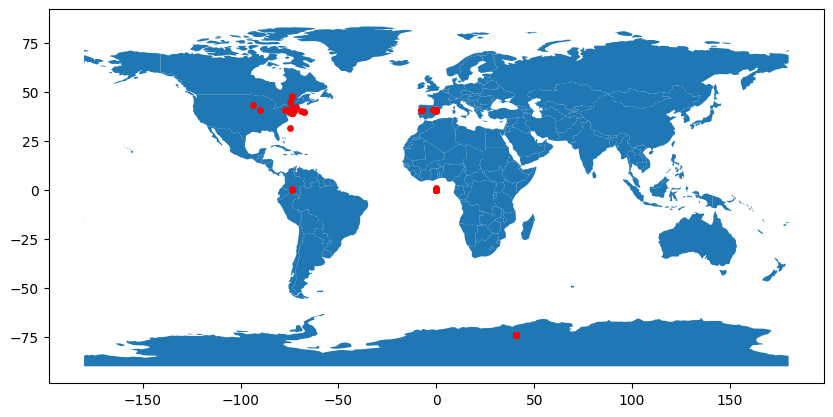

In [299]:
#Visualize trips
geometry = [Point(xy) for xy in zip(df_limits['pickup_longitude'], df_limits['pickup_latitude'])]
gdf = GeoDataFrame(df_limits, geometry=geometry)   


world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
gdf.plot(ax=world.plot(figsize=(10, 6)), marker='o', color='red', markersize=15);

Next we will clean data using the IQR for several columns

In [300]:
df_limits.describe()

,id,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance
count,1.932810e+05,193281.000000,193281.000000,193281.000000,193281.000000,193281.000000,193281.000000,193281.000000
mean,2.770879e+07,11.334854,-73.827026,40.647036,-73.837577,40.651481,1.691351,20.935857
std,1.600803e+07,9.579653,3.658364,2.934588,3.537420,2.904408,1.387685,382.371141
min,1.000000e+00,0.010000,-93.824668,-74.015515,-75.458979,-74.015750,1.000000,0.010000
25%,1.382749e+07,6.000000,-73.992268,40.736365,-73.991587,40.735241,1.000000,1.290000
50%,2.774050e+07,8.500000,-73.982119,40.753250,-73.980545,40.753713,1.000000,2.190000
75%,4.153843e+07,12.500000,-73.968423,40.767512,-73.965456,40.768312,2.000000,3.960000
max,5.542357e+07,230.000000,40.808425,48.018760,40.831932,45.031598,208.000000,8777.380000


In [301]:
#Clean data using interquartile range
# calculate IQR for distance
Q1 = df_limits['distance'].quantile(0.05)
Q3 = df_limits['distance'].quantile(0.95)
IQR = Q3 - Q1

# identify outliers
threshold = 1.5
outliers = df_limits[(df_limits['distance'] < Q1 - threshold * IQR) | (df_limits['distance'] > Q3 + threshold * IQR)]

# drop rows containing outliers
df_limits = df_limits.drop(outliers.index)

df_limits.describe()

,id,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance
count,1.926760e+05,192676.000000,192676.000000,192676.000000,192676.000000,192676.000000,192676.000000,192676.000000
mean,2.771063e+07,11.278625,-73.910988,40.688752,-73.909967,40.688984,1.691596,3.338652
std,1.600820e+07,9.330338,2.680708,2.624575,2.680778,2.624848,1.388058,3.531440
min,1.000000e+00,0.010000,-75.387785,-74.015515,-75.417737,-74.015750,1.000000,0.010000
25%,1.382668e+07,6.000000,-73.992282,40.736477,-73.991598,40.735330,1.000000,1.280000
50%,2.774779e+07,8.500000,-73.982140,40.753303,-73.980582,40.753732,1.000000,2.180000
75%,4.154048e+07,12.500000,-73.968526,40.767537,-73.965609,40.768307,2.000000,3.930000
max,5.542357e+07,220.000000,40.808425,45.031653,40.831932,45.031598,208.000000,24.590000


C:\Users\Ryman\AppData\Local\Temp\ipykernel_22204\655114265.py:6: FutureWarning:

The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.



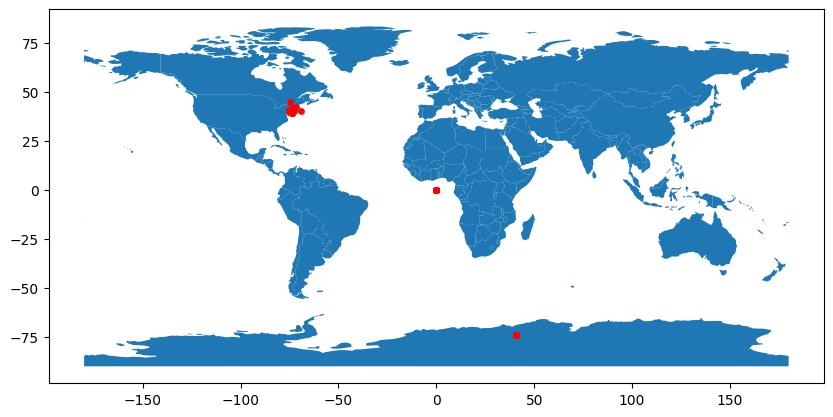

In [302]:
#Visualize trips
geometry = [Point(xy) for xy in zip(df_limits['pickup_longitude'], df_limits['pickup_latitude'])]
gdf = GeoDataFrame(df_limits, geometry=geometry)   


world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
gdf.plot(ax=world.plot(figsize=(10, 6)), marker='o', color='red', markersize=15);

In [303]:
#Different ranges for fares
Q1 = df_limits['fare_amount'].quantile(0.05)
Q3 = df_limits['fare_amount'].quantile(0.95)
IQR = Q3 - Q1

# identify outliers
threshold = 1.5
outliers = df_limits[(df_limits['fare_amount'] < Q1 - threshold * IQR) | (df_limits['fare_amount'] > Q3 + threshold * IQR)]

# drop rows containing outliers
df_limits = df_limits.drop(outliers.index)

df_limits.describe()

,id,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance
count,1.924300e+05,192430.000000,192430.000000,192430.000000,192430.000000,192430.000000,192430.000000,192430.000000
mean,2.770928e+07,11.186164,-73.910913,40.688678,-73.909726,40.688947,1.691644,3.323065
std,1.600837e+07,8.950099,2.682419,2.626251,2.682478,2.626524,1.388245,3.499037
min,1.000000e+00,0.010000,-75.387785,-74.015515,-75.417737,-74.015750,1.000000,0.010000
25%,1.382545e+07,6.000000,-73.992281,40.736477,-73.991572,40.735407,1.000000,1.280000
50%,2.774463e+07,8.500000,-73.982140,40.753303,-73.980561,40.753763,1.000000,2.180000
75%,4.153882e+07,12.500000,-73.968525,40.767546,-73.965592,40.768313,2.000000,3.930000
max,5.542357e+07,68.500000,40.808425,45.031653,40.831932,45.031598,208.000000,24.590000


In [304]:
Q1 = df_limits['pickup_longitude'].quantile(0.05)
Q3 = df_limits['pickup_longitude'].quantile(0.95)
IQR = Q3 - Q1

# identify outliers
threshold = 1.5
outliers = df_limits[(df_limits['pickup_longitude'] < Q1 - threshold * IQR) | (df_limits['pickup_longitude'] > Q3 + threshold * IQR)]

# drop rows containing outliers
df_limits = df_limits.drop(outliers.index)

df_limits.describe()

,id,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance
count,1.891770e+05,189177.000000,189177.000000,189177.000000,189177.000000,189177.000000,189177.000000,189177.000000
mean,2.770483e+07,10.692833,-73.978801,40.752480,-73.975229,40.751495,1.690279,3.115838
std,1.600511e+07,7.874805,0.023840,0.024447,0.031408,0.030734,1.389091,3.008338
min,1.000000e+00,0.010000,-74.104135,39.605438,-74.237280,39.607967,1.000000,0.010000
25%,1.382309e+07,6.000000,-73.992469,40.737551,-73.991632,40.735862,1.000000,1.270000
50%,2.774403e+07,8.500000,-73.982355,40.753925,-73.980677,40.753929,1.000000,2.150000
75%,4.152299e+07,12.500000,-73.969574,40.767881,-73.966033,40.768398,2.000000,3.810000
max,5.542357e+07,68.500000,-73.836943,41.080965,-73.584435,41.078422,208.000000,24.540000


In [305]:
Q1 = df_limits['dropoff_longitude'].quantile(0.05)
Q3 = df_limits['dropoff_longitude'].quantile(0.95)
IQR = Q3 - Q1

# identify outliers
threshold = 1.5
outliers = df_limits[(df_limits['dropoff_longitude'] < Q1 - threshold * IQR) | (df_limits['dropoff_longitude'] > Q3 + threshold * IQR)]

# drop rows containing outliers
df_limits = df_limits.drop(outliers.index)

df_limits.describe()

,id,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance
count,1.874310e+05,187431.000000,187431.000000,187431.000000,187431.000000,187431.000000,187431.000000,187431.000000
mean,2.770322e+07,10.344279,-73.978873,40.752470,-73.976724,40.752296,1.689640,2.968307
std,1.600406e+07,6.946608,0.023674,0.024448,0.025533,0.029457,1.389504,2.579650
min,1.000000e+00,0.010000,-74.104135,39.605438,-74.120035,39.607967,1.000000,0.010000
25%,1.382534e+07,6.000000,-73.992488,40.737535,-73.991694,40.736595,1.000000,1.270000
50%,2.774444e+07,8.300000,-73.982363,40.753891,-73.980834,40.754257,1.000000,2.130000
75%,4.151441e+07,12.100000,-73.969587,40.767880,-73.966653,40.768517,2.000000,3.740000
max,5.542357e+07,68.250000,-73.836943,41.080965,-73.817088,41.078422,208.000000,24.540000


In [306]:
Q1 = df_limits['pickup_latitude'].quantile(0.05)
Q3 = df_limits['pickup_latitude'].quantile(0.95)
IQR = Q3 - Q1

# identify outliers
threshold = 1.5
outliers = df_limits[(df_limits['pickup_latitude'] < Q1 - threshold * IQR) | (df_limits['pickup_latitude'] > Q3 + threshold * IQR)]

# drop rows containing outliers
df_limits = df_limits.drop(outliers.index)

df_limits.describe()

,id,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance
count,1.873780e+05,187378.000000,187378.000000,187378.000000,187378.000000,187378.000000,187378.000000,187378.000000
mean,2.770134e+07,10.343834,-73.978874,40.752531,-73.976724,40.752352,1.689665,2.968171
std,1.600392e+07,6.944992,0.023659,0.023252,0.025516,0.028483,1.389545,2.578771
min,1.000000e+00,0.010000,-74.104135,40.606027,-74.120035,40.546080,1.000000,0.010000
25%,1.382342e+07,6.000000,-73.992488,40.737545,-73.991693,40.736609,1.000000,1.270000
50%,2.773996e+07,8.500000,-73.982365,40.753895,-73.980835,40.754266,1.000000,2.130000
75%,4.151189e+07,12.100000,-73.969595,40.767880,-73.966657,40.768517,2.000000,3.740000
max,5.542357e+07,68.250000,-73.836943,40.897140,-73.817204,40.943723,208.000000,24.540000


In [307]:
Q1 = df_limits['dropoff_latitude'].quantile(0.05)
Q3 = df_limits['dropoff_latitude'].quantile(0.95)
IQR = Q3 - Q1

# identify outliers
threshold = 1.5
outliers = df_limits[(df_limits['dropoff_latitude'] < Q1 - threshold * IQR) | (df_limits['dropoff_latitude'] > Q3 + threshold * IQR)]

# drop rows containing outliers
df_limits = df_limits.drop(outliers.index)

df_limits.describe()

,id,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance
count,1.873510e+05,187351.000000,187351.000000,187351.000000,187351.000000,187351.000000,187351.000000,187351.000000
mean,2.770111e+07,10.338606,-73.978876,40.752533,-73.976728,40.752363,1.689593,2.965813
std,1.600416e+07,6.929805,0.023655,0.023248,0.025499,0.028402,1.389448,2.571015
min,1.000000e+00,0.010000,-74.104135,40.606027,-74.116678,40.578078,1.000000,0.010000
25%,1.382206e+07,6.000000,-73.992488,40.737545,-73.991693,40.736615,1.000000,1.270000
50%,2.773985e+07,8.300000,-73.982366,40.753895,-73.980837,40.754267,1.000000,2.130000
75%,4.151210e+07,12.100000,-73.969595,40.767882,-73.966662,40.768517,2.000000,3.740000
max,5.542357e+07,68.250000,-73.836943,40.897140,-73.817204,40.916956,208.000000,24.110000


In [308]:
#Set maximum passengers to 7 - what a minivan would hold

df_limits = df_limits[(df_limits['passenger_count'] <= 7)]

Next I will perform visualizations to see how the data looks after cleaning

C:\Users\Ryman\AppData\Local\Temp\ipykernel_22204\86233136.py:6: FutureWarning:

The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.



<Axes: >

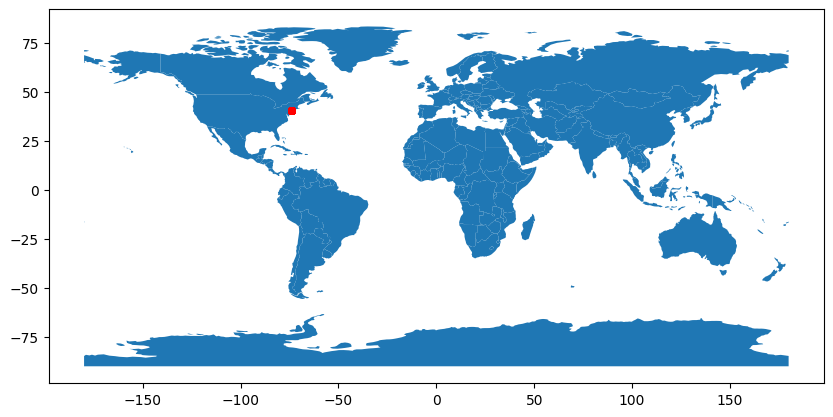

In [309]:
#Visualize trips
geometry = [Point(xy) for xy in zip(df_limits['pickup_longitude'], df_limits['pickup_latitude'])]
gdf = GeoDataFrame(df_limits, geometry=geometry)   


world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
gdf.plot(ax=world.plot(figsize=(10, 6)), marker='o', color='red', markersize=15)

The data here is now much more concentrated to where the vast majority of trips were performed. 

In [310]:
#Distance and fare amount

fig = px.scatter(df_limits, x='distance', y='fare_amount')
fig.show()

The data is much more concentrated now

In [311]:
#Convert dates to date time format

df_limits['pickup_datetime'] = pd.to_datetime(df_limits['pickup_datetime']) 

df_limits['Year'] = df_limits['pickup_datetime'].dt.year
df_limits['month'] = df_limits['pickup_datetime'].dt.month_name()
df_limits['weekday'] = df_limits['pickup_datetime'].dt.day_name()
df_limits['hour'] = df_limits['pickup_datetime'].dt.hour



df_limits.head()

,id,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance,Year,month,weekday,hour
0,24238194,7.5,2015-05-07 19:52:06+00:00,-73.999817,40.738354,-73.999512,40.723217,1,1.68,2015,May,Thursday,19
1,27835199,7.7,2009-07-17 20:04:56+00:00,-73.994355,40.728225,-73.994710,40.750325,1,2.46,2009,July,Friday,20
2,44984355,12.9,2009-08-24 21:45:00+00:00,-74.005043,40.740770,-73.962565,40.772647,1,5.03,2009,August,Monday,21
3,25894730,5.3,2009-06-26 08:22:21+00:00,-73.976124,40.790844,-73.965316,40.803349,3,1.66,2009,June,Friday,8
4,17610152,16.0,2014-08-28 17:47:00+00:00,-73.925023,40.744085,-73.973082,40.761247,5,4.47,2014,August,Thursday,17


I will now add a column that contains the time of day based upon the hour, as taxis in NYC have a rush hour surcharge of $2.50 (from 4-8pm) and a $1 surcharge for overnight rides (8pm to 6pm)

found here: https://www.nyc.gov/site/tlc/passengers/taxi-fare.page

In [312]:
#Function to be able to display time of day in PowerBI charts

def time_of_day(hour):
    if hour >= 16 and hour < 20:
        return 'Rush Hour'
    elif hour >= 6 and hour < 12:
        return 'Morning'
    elif hour >= 12 and hour < 16:
        return 'Afternoon'
    else:
        return 'Overnight'
    


In [313]:
df_limits['time_of_day'] = df_limits['hour'].apply(time_of_day)
df_limits.head()

,id,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance,Year,month,weekday,hour,time_of_day
0,24238194,7.5,2015-05-07 19:52:06+00:00,-73.999817,40.738354,-73.999512,40.723217,1,1.68,2015,May,Thursday,19,Rush Hour
1,27835199,7.7,2009-07-17 20:04:56+00:00,-73.994355,40.728225,-73.994710,40.750325,1,2.46,2009,July,Friday,20,Overnight
2,44984355,12.9,2009-08-24 21:45:00+00:00,-74.005043,40.740770,-73.962565,40.772647,1,5.03,2009,August,Monday,21,Overnight
3,25894730,5.3,2009-06-26 08:22:21+00:00,-73.976124,40.790844,-73.965316,40.803349,3,1.66,2009,June,Friday,8,Morning
4,17610152,16.0,2014-08-28 17:47:00+00:00,-73.925023,40.744085,-73.973082,40.761247,5,4.47,2014,August,Thursday,17,Rush Hour


In [314]:
#Export for PowerBI

df_limits.to_csv('taxidata', encoding='UTF-8')